In [1]:
import numpy as np
import matplotlib
import numpy as np
import matplotlib.cm as cm
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import pylab as pl
import collections
import csv
import requests
import urllib
import operator
from PIL import Image
import io
import urllib.request
%matplotlib inline

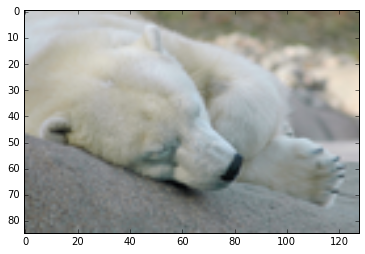

In [2]:
url = "http://farm3.static.flickr.com/2407/2092998073_33beab173f.jpg"
def get_img(URL):
    with urllib.request.urlopen(URL) as req:
        image_file = io.BytesIO(req.read())
        #with open('test.jpg', 'wb') as w:
        #    w.write()
        im = Image.open(image_file)
        im.thumbnail((128, 128), Image.ANTIALIAS)
        return im
im = get_img(url)
plt.imshow(im)

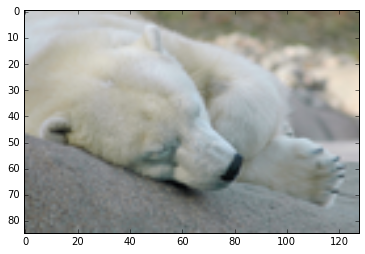

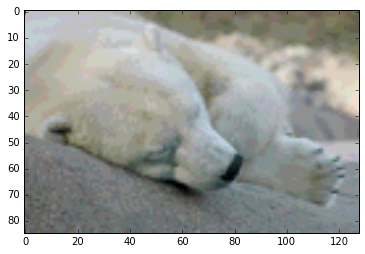

In [3]:
def get_mat(im):
    size = im.size
    mat = np.array(im.getdata(), dtype=np.uint8)
    mat = mat.reshape((size[1], size[0], 3))
    return mat
mat = get_mat(im)
plt.figure()
plt.imshow(mat)
roundmat = np.floor(mat/16)*16
roundmat = roundmat.astype("uint8")
plt.figure()
plt.imshow(roundmat)

In [4]:
def to_rgb(a):
    return  (a>>8) & 15, (a>>4) & 15, a & 15
def to_color(pixel):
    return pixel[2] | (pixel[1] << 4) | (pixel[0] << 8)
def color_cmp(a, b):
    a3, a2, a1 = to_rgb(a)
    b3, b2, b1 = to_rgb(b)
    return abs(a3 - b3)**2 + abs(a2 - b2)**2 + abs(a1 - b1)**2

In [5]:
def get_colormap(mat, colormap = collections.defaultdict(int)):
    colors = np.floor(mat/16).astype('uint8')
    for row in colors:
        for pixel in row:
            color = to_color(pixel)
            colormap[color] += 1
    return colormap
colormap = get_colormap(mat)
print(colormap)

defaultdict(<class 'int'>, {1108: 13, 1: 4, 2475: 20, 2455: 39, 1398: 2, 0: 13, 1381: 20, 1364: 19, 307: 1, 1347: 1, 1894: 14, 1671: 1, 580: 1, 273: 13, 17: 10, 2218: 1, 1893: 48, 836: 14, 290: 9, 2200: 60, 2166: 132, 1109: 39, 1092: 28, 2473: 18, 546: 12, 1399: 3, 2439: 12, 2438: 3, 1365: 59, 1348: 2, 3548: 122, 1672: 6, 1927: 73, 4076: 4, 1621: 2, 3002: 580, 1945: 1, 2440: 3, 1928: 466, 819: 20, 820: 2, 3294: 29, 3275: 315, 2185: 128, 2201: 432, 2167: 16, 2491: 3, 2457: 452, 1400: 1, 1090: 1, 1091: 12, 3804: 93, 837: 1, 3787: 1, 1673: 1, 1382: 59, 3037: 6, 4077: 22, 2986: 106, 1929: 10, 3310: 1, 1363: 2, 1620: 2, 3259: 74, 563: 13, 2764: 5, 1892: 1, 3549: 175, 3532: 73, 3258: 68, 2149: 4, 3805: 10, 2747: 154, 1636: 9, 1637: 90, 1638: 279, 1127: 1, 3038: 2, 3004: 139, 1383: 2, 1125: 1, 1656: 4, 1653: 13, 1654: 70, 1911: 814, 3550: 43, 1639: 22, 1925: 1, 2182: 139, 2183: 337, 2184: 718, 2441: 7, 2711: 1, 3821: 24, 2456: 218, 835: 5, 3566: 7, 2454: 1, 2199: 8, 2712: 11, 2713: 13, 2458: 

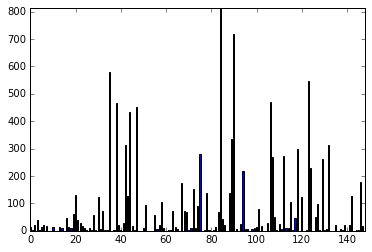

In [6]:
d = colormap
X = np.arange(len(d))
pl.bar(X, d.values(), align='center', width=0.5)
#pl.xticks(X, d.keys())
ymax = max(d.values()) + 1
pl.ylim(0, ymax)
pl.xlim(0, len(d))
pl.show()

[(1911, 814), (2184, 718), (3002, 580), (3276, 547), (2729, 469), (1928, 466), (2457, 452), (2201, 432), (2183, 337), (3293, 315), (3275, 315), (1910, 297), (1638, 279), (3003, 272), (2730, 269), (1655, 262), (3277, 229), (2456, 218), (2474, 180), (3549, 175), (2747, 154), (2182, 139), (3004, 139), (2166, 132), (2185, 128), (2985, 127), (3020, 125), (3548, 122), (2986, 106), (1909, 104), (1912, 99), (3804, 93), (1637, 90), (2458, 78), (3259, 74), (3532, 73), (1927, 73), (1654, 70), (3258, 68), (2200, 60), (1382, 59), (1365, 59), (3021, 50), (2731, 49), (1893, 48), (3531, 46), (3550, 43), (1109, 39), (2455, 39), (2728, 30), (3294, 29), (1092, 28), (3001, 26), (3821, 24), (2748, 23), (1639, 22), (4077, 22), (1926, 21), (3820, 20), (819, 20), (1381, 20), (2475, 20), (1364, 19), (2473, 18), (2202, 17), (2165, 16), (2167, 16), (836, 14), (1894, 14), (2713, 13), (1653, 13), (563, 13), (273, 13), (0, 13), (1108, 13), (1091, 12), (2439, 12), (546, 12), (2712, 11), (3805, 10), (1929, 10), (17, 

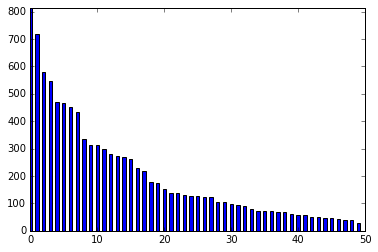

In [7]:
sorted_colors = sorted(colormap.items(), key=operator.itemgetter(1))[::-1]
print(sorted_colors)
d = sorted_colors[:50]
X = np.arange(len(d))
pl.bar(X, np.array(d)[:,1], align='center', width=0.5)
#pl.xticks(X, d.keys())
ymax = max(np.array(d)[:,1]) + 1
pl.ylim(0, ymax)
pl.xlim(0, len(d))
pl.show()

In [8]:
def compress_colors(colormap, N=50, max_diff=1):
    sorted_colors = sorted(colormap.items(), key=operator.itemgetter(1))[::-1]
    color_list = []
    color_dict = {}
    for item in sorted_colors:
        best = 9999999
        bestn = -1
        for color in color_list:
            if color_cmp(color, item[0]) < best:
                best = color_cmp(color, item[0])
                bestn = color
        if best <= max_diff or len(color_list) >= N:
            color_dict[item[0]] = bestn
        else:
            color_list.append(item[0])
            color_dict[item[0]] = item[0]
    return color_list, color_dict
color_list, color_dict = compress_colors(colormap)
print(color_dict)

{0: 0, 1: 0, 2475: 2474, 1398: 1399, 2438: 2182, 1127: 1126, 307: 291, 1347: 1363, 290: 546, 2711: 2455, 1654: 1638, 1637: 1638, 1620: 1636, 17: 273, 1927: 1911, 2218: 2474, 836: 1092, 819: 819, 1126: 1126, 2149: 2149, 545: 546, 546: 546, 1399: 1399, 1926: 2182, 2746: 3002, 1348: 1092, 3804: 3548, 2712: 2712, 2439: 2455, 1638: 1638, 3019: 3019, 3549: 3293, 1945: 1929, 2184: 2184, 818: 819, 563: 819, 3292: 3276, 1894: 1638, 1929: 1929, 820: 819, 1925: 1909, 2167: 1911, 2491: 2747, 1671: 1672, 2457: 2457, 1400: 1399, 2440: 2184, 1091: 1092, 1092: 1092, 1093: 1092, 3787: 3531, 2730: 2729, 2713: 2729, 1656: 1672, 3037: 3293, 3020: 3276, 3003: 3002, 1383: 1399, 1363: 1363, 1108: 1092, 1109: 1365, 1366: 1365, 2764: 2764, 2168: 2184, 3002: 3002, 1893: 1909, 2441: 2457, 3805: 3821, 3259: 3259, 1636: 1636, 1381: 1365, 1382: 1638, 273: 273, 3038: 3038, 2748: 2747, 1673: 1929, 1639: 1638, 3260: 3276, 2165: 1909, 1910: 1911, 1911: 1911, 3550: 3550, 1876: 1876, 2454: 2455, 2182: 2182, 2183: 2184, 1

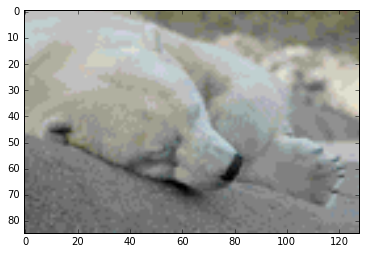

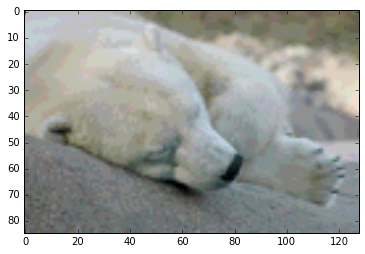

In [9]:
def compress_image(color_dict, mat):
    nearestn = np.floor(mat/16).astype('uint8')
    for row in nearestn:
        for i, pixel in enumerate(row):
            row[i] = to_rgb(color_dict[to_color(pixel)])
    nearestn = (nearestn * 16).astype("uint8")
    return nearestn
nearestn = compress_image(color_dict, mat)
plt.figure()
plt.imshow(nearestn)
plt.figure()
plt.imshow(roundmat)

In [10]:
def get_imgurls(wnid):
    r = requests.get("http://image-net.org/api/text/imagenet.synset.geturls?wnid="+wnid, stream=True)
    urls = []
    for line in r.iter_lines():
        if line:
            urls.append(line.decode("utf-8") )
    return urls

In [36]:
urls = get_imgurls("n09393524")
print(urls[:10])

['http://farm4.static.flickr.com/3004/2766314860_38f58be41d.jpg', 'http://farm4.static.flickr.com/3165/2852923397_6e73e6c98a.jpg', 'http://media-cdn.tripadvisor.com/media/photo-s/01/12/14/9f/la-plage-d-orient-beach.jpg', 'http://www.frenchfriends.info/g2/main.php?g2_view=core.DownloadItem&g2_itemId=2159&g2_serialNumber=2', 'http://aruno.ifrance.com/vendee/plage.jpg', 'http://farm2.static.flickr.com/1115/1351712477_d5347b73de.jpg', 'http://farm3.static.flickr.com/2124/2026920634_f99fb7a25f.jpg', 'http://farm4.static.flickr.com/3003/2838511339_6234946303.jpg', 'http://farm4.static.flickr.com/3082/2484097786_a14ac59cd1.jpg', 'http://www.51yala.com/UPLOAD/NewsIMG/200612151453240.jpg']


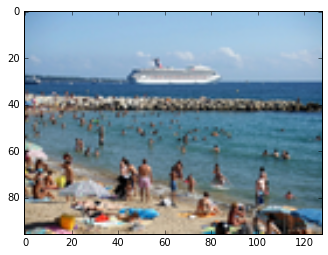

In [12]:
def get_img(URL):
    with urllib.request.urlopen(URL) as req:
        image_file = io.BytesIO(req.read())
        #with open('test.jpg', 'wb') as w:
        #    w.write()
        im = Image.open(image_file)
        im.thumbnail((128, 128), Image.ANTIALIAS)
        return im
im = get_img(urls[1])
plt.imshow(im)

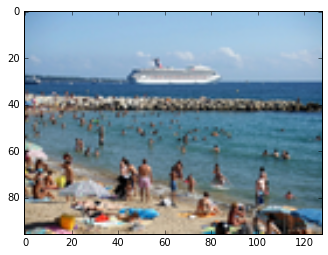

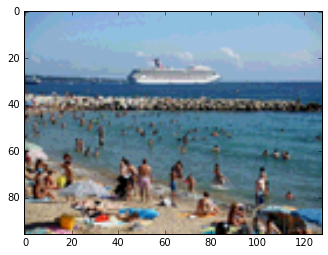

In [13]:
mat = get_mat(im)
plt.figure()
plt.imshow(mat)
roundmat = np.floor(mat/16)*16
roundmat = roundmat.astype("uint8")
plt.figure()
plt.imshow(roundmat)

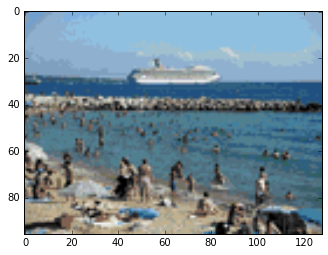

In [14]:
colormap = get_colormap(mat)
color_list, color_dict = compress_colors(colormap)
nearestn = compress_image(color_dict, mat)
plt.figure()
plt.imshow(nearestn)

In [37]:
colormap = collections.defaultdict(int)
mats = []
for url in urls:
    try:
        im = get_img(url)
        mat = get_mat(im)
        mats.append(mat)
        colormap = get_colormap(mat, colormap)
    except:
        pass
color_list, color_dict = compress_colors(colormap, N=100)

C:\Anaconda3\lib\site-packages\matplotlib\pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


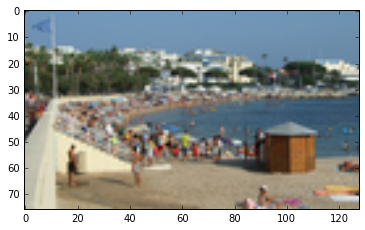

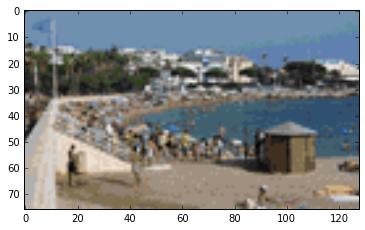

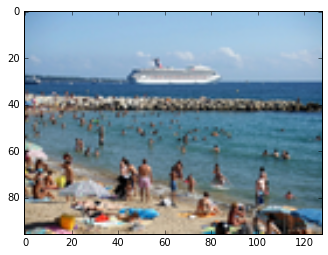

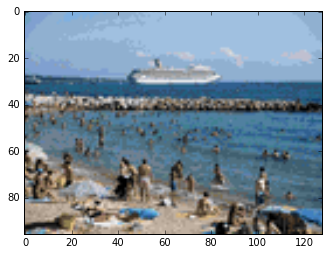

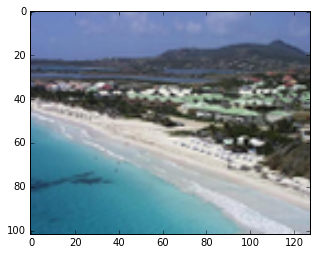

...

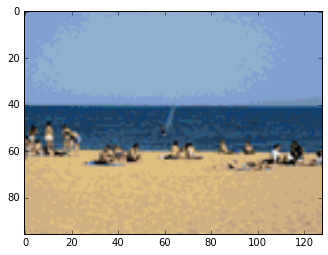

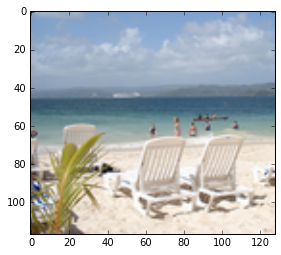

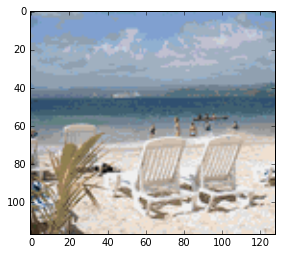

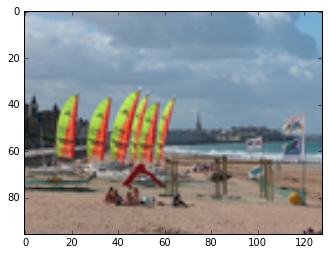

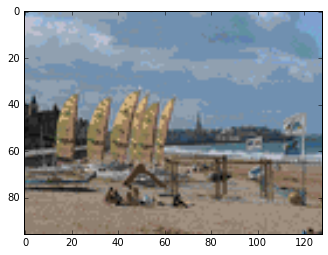

In [16]:
for mat in mats:
    nearestn = compress_image(color_dict, mat)
    plt.figure()
    plt.imshow(mat)
    plt.figure()
    plt.imshow(nearestn)

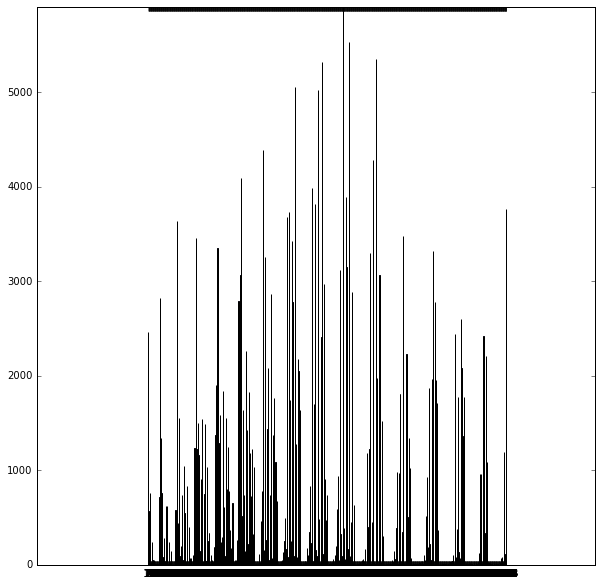

In [17]:
plt.figure(figsize=(10,10))
d = colormap
X = np.arange(len(d))
pl.bar(X, d.values(), align='center', width=0.5)
pl.xticks(X, d.keys())
ymax = max(d.values()) + 1
pl.ylim(0, ymax)
pl.show()

In [18]:
class Markov(object):
    """ Constructor for a Markov model.  States are stored as integers

        state = 0, 1, 2, .. n-1

    where `n` is the number of states.

    Example Usage:

    >>> m = Markov(["a", "b"])          # Markov model with 2 states
    >>> m.state = "a"               # Set state to first state
    >>> m._transition_matrix = [[0, 1],    # Sets the transition matrix
    ...                         [1, 0]]
    >>> m.state()
    'a'
    >>> m.step()
    'b'
    >>> m.step()
    'a'
    """
    def __init__(self, states):
        """ Constructs a Markov model.

        Args:
            states: list of states
            mat: 2D array of transitions (n-by-n matrix) (default=None)

        Returns:
            Markov instance
        """
        self._states = states
        self._state2Index = {}
        for i, state in enumerate(states):
            self._state2Index[state] = i

        n = len(states)
        #self._transition_matrix = dok_matrix(np.zeros((n, n)))
        self._transition_matrix = np.zeros((n, n))

    def step(self, states):
        """ Perform one update based on the transition matrix
        and the current state.

        Returns:
            new state
        """
        ps = np.zeros(self._transition_matrix.shape[0])
        for state in states:
        
            i = self._state2Index[state]

            # Get probability distribution given current state
            ps = np.add(ps, self._transition_matrix[i])

        # Normalize
        ps /= np.sum(ps)

        # New state
        state = self._states[np.random.choice(len(self._states), p=ps)]
        return state

    def update_transition(self, next_state, prev_state):
        """ Adjusts the transition matrix given an extra sample. """
        next_index = self._state2Index[next_state]
        prev_index = self._state2Index[prev_state]
        self._transition_matrix[next_index][prev_index] += 1


In [19]:
def compute_markov(markov, mat, color_dict):
    w, h, _ = mat.shape
    nearestn = np.floor(mat/16).astype('uint8')
    dxys = [(-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)]

    for x in range(w):
        for y in range(h):
            # Source pixel
            src_color = color_dict[to_color(nearestn[x, y])]

            # Destination pixels
            dest_colors = []
            for (dx, dy) in dxys:
                nx = x + dx
                ny = y + dy

                if nx < 0:
                    nx += w
                elif nx >= w:
                    nx -= w
                if ny < 0:
                    ny += h
                elif ny >= h:
                    ny -= h

                dest_color = color_dict[to_color(nearestn[nx, ny])]
                markov.update_transition(dest_color, src_color)

In [20]:
markov = Markov(color_list)
for mat in mats:
    compute_markov(markov, mat, color_dict)

In [21]:
mat = compress_image(color_dict, mats[4])
state = color_list[50]
for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
        mat[i, j] = np.array(to_rgb(markov.step([to_color((mat[i, j]/16).astype("uint8"))]))) * 16

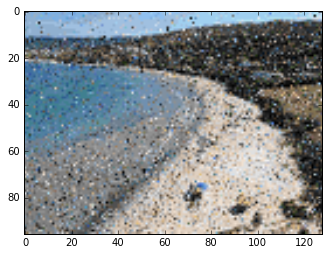

In [22]:
plt.imshow(mat)

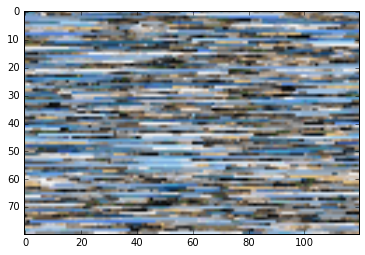

In [23]:
mat = np.zeros((80, 120, 3), dtype="uint8")
state = color_list[50]
for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
        mat[i, j] = np.array(to_rgb(state)) * 16
        state = markov.step([state])
plt.imshow(mat)

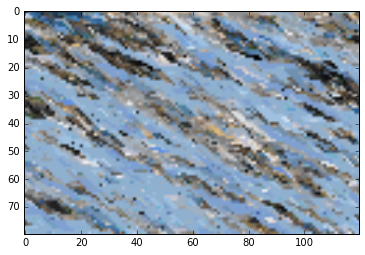

In [24]:
mat = np.zeros((80, 120, 3), dtype="uint8")
state = color_list[50]
for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
        mat[i, j] = np.array(to_rgb(state)) * 16
        states = [state]
        if i != 0:
            states.append(to_color((mat[i-1, j]/16).astype("uint8")))
        state = markov.step(states)
plt.imshow(mat)

In [38]:
colormap = get_colormap(mats[6])
color_list, color_dict = compress_colors(colormap, N=100)
markov = Markov(color_list)
compute_markov(markov, mats[6], color_dict)

In [39]:
def convert_pixel(pixel):
    return to_color((pixel/16).astype("uint8"))
def spiral_reconstruct(mat, rmin, rmax, cmin, cmax):
    mat = np.copy(mat)
    mat[rmin:rmax, cmin:cmax] = (0,0,0)
    while rmin <= rmax and cmin <= cmax:
        for c in range(cmin, cmax):
            states = [convert_pixel(mat[rmin, c-1]), convert_pixel(mat[rmin-1, c]),
                     convert_pixel(mat[rmin-1, c-1]), convert_pixel(mat[rmin-1, c+1])]
            mat[rmin, c] = np.array(to_rgb(markov.step(states))) * 16
            states = [convert_pixel(mat[rmax-1, c-1]), convert_pixel(mat[rmax, c]),
                      convert_pixel(mat[rmax, c-1]), convert_pixel(mat[rmax, c+1])]
            mat[rmax-1, c] = np.array(to_rgb(markov.step(states))) * 16
        for r in range(rmin, rmax):
            states = [convert_pixel(mat[r, cmin-1]), convert_pixel(mat[r-1, cmin]),
                     convert_pixel(mat[r-1, cmin-1]), convert_pixel(mat[r+1, cmin-1])]
            mat[r, cmin] = np.array(to_rgb(markov.step(states))) * 16
            states = [convert_pixel(mat[r, cmax]), convert_pixel(mat[r-1, cmax-1]),
                     convert_pixel(mat[r-1, cmax]), convert_pixel(mat[r+1, cmax])]
            mat[r, cmax-1] = np.array(to_rgb(markov.step(states))) * 16
        rmin += 1
        rmax -= 1
        cmin += 1
        cmax -= 1
    return mat

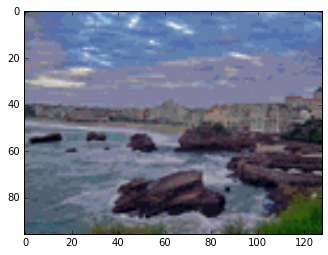

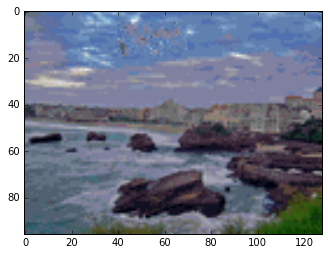

In [61]:
mat = compress_image(color_dict, mats[6])
plt.figure()
plt.imshow(mat)
mat3 = spiral_reconstruct(mat, 5, 20, 40, 70)
plt.figure()
plt.imshow(mat3)

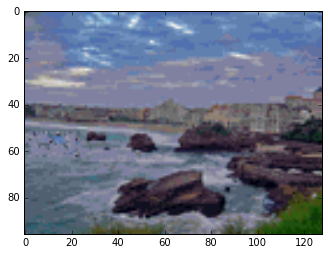

In [57]:
mat2 = spiral_reconstruct(mat, 52, 63, 2, 24)
plt.figure()
plt.imshow(mat2)

In [29]:
urls = get_imgurls("n07801091")
colormap = collections.defaultdict(int)
mats = []
for url in urls[:100]:
    try:
        im = get_img(url)
        mat = get_mat(im)
        mats.append(mat)
        colormap = get_colormap(mat, colormap)
    except:
        pass
color_list, color_dict = compress_colors(colormap, N=100)

In [30]:
markov = Markov(color_list)
for mat in mats:
    compute_markov(markov, mat, color_dict)

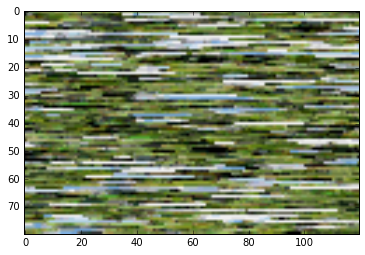

In [31]:
mat = np.zeros((80, 120, 3), dtype="uint8")
state = color_list[50]
for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
        mat[i, j] = np.array(to_rgb(state)) * 16
        state = markov.step([state])
plt.imshow(mat)

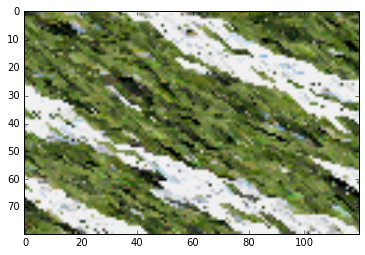

In [32]:
mat = np.zeros((80, 120, 3), dtype="uint8")
state = color_list[50]
for i in range(mat.shape[0]):
    for j in range(mat.shape[1]):
        mat[i, j] = np.array(to_rgb(state)) * 16
        states = [state]
        if i != 0:
            states.append(to_color((mat[i-1, j]/16).astype("uint8")))
        state = markov.step(states)
plt.imshow(mat)

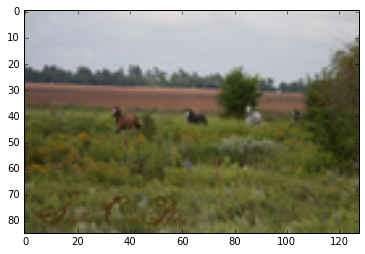

In [33]:
plt.imshow(mats[3])

In [34]:
colormap = get_colormap(mats[3])
color_list, color_dict = compress_colors(colormap, N=200, max_diff=0)
markov = Markov(color_list)
compute_markov(markov, mats[3], color_dict)

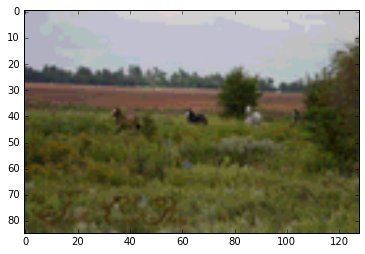

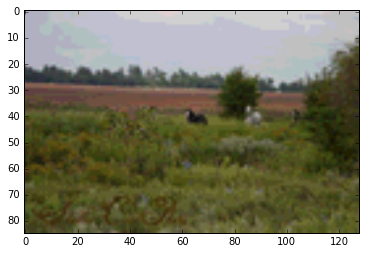

In [35]:
mat = compress_image(color_dict, mats[3])
plt.figure()
plt.imshow(mat)
mat = spiral_reconstruct(mat, 36, 50, 30, 50)
plt.figure()
plt.imshow(mat)